In [11]:
import os 
import utils
import imageutils
import adv_laneline_detection
import matplotlib.image as mpimg
from importlib import reload
import matplotlib.pyplot as plt
import numpy as np
import cv2
import kerasmodel
import datasetclasses
from PIL import Image


In [2]:
reload(utils)
reload(imageutils)
reload(adv_laneline_detection)

<module 'adv_laneline_detection' from 'C:\\Users\\modmo\\SelfDrivingCar\\projects\\advancedLaneFinding\\CarND-Advanced-Lane-Lines\\adv_laneline_detection.py'>

## Camera Calibration 

### Load in Camera Calibration Images

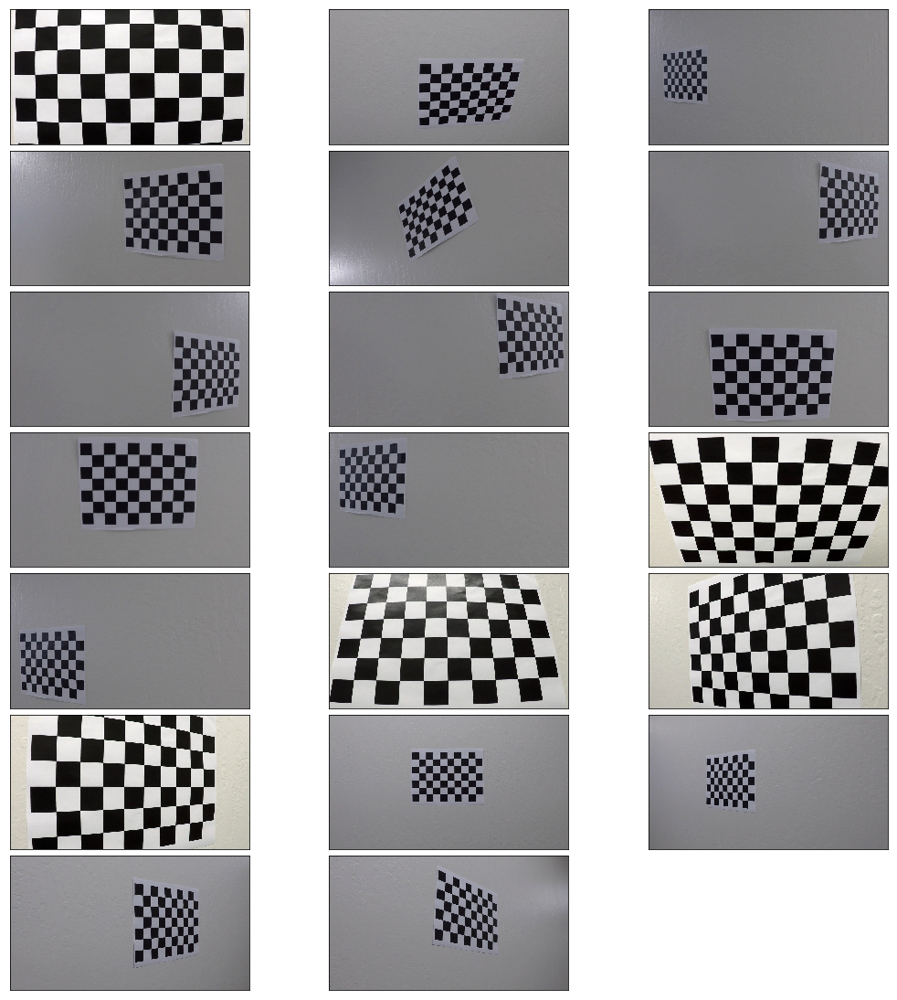

In [3]:
# load in Chessboard Calibration images 
directory = "camera_cal/"
calibration_images = utils.Load_images_for_directory(directory)

utils.show_images(calibration_images, image_name='all_camera_calibration_images', cols=3)

### Get Image Chessboard Corners

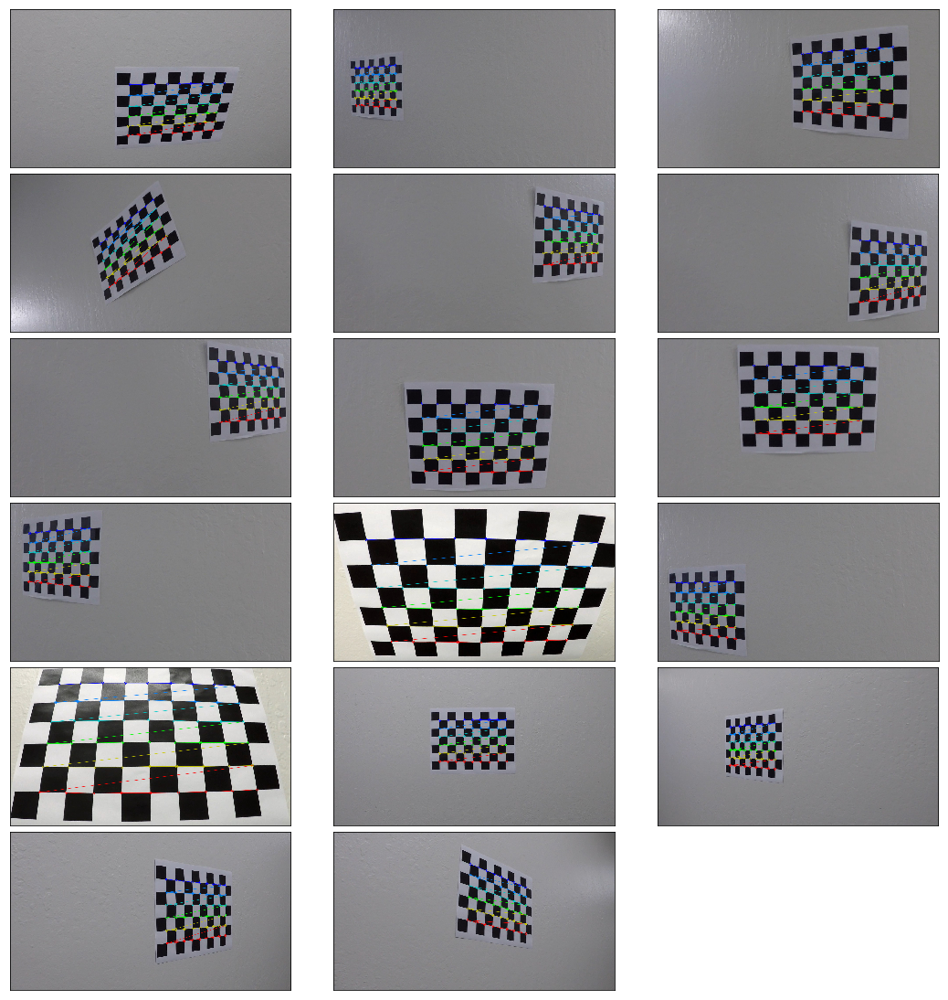

In [4]:
# calibration_points = utils.load_calibration_points_from_pickle()

# if utils.CALIBRATION_PICKLE_FILE in os.listdir('.') and len(calibration_points) > 1:
#     # Load calibration images from pickle file 
# #     calibration_points = utils.load_calibration_points_from_pickle()
#     object_points = calibration_points['object_points']
#     image_points = calibration_points['image_points']
#     plt.imshow(mpimg.imread('output_images/all_calibration_corner_images.png'))
# else :

images_object_points, images_points, corner_images = adv_laneline_detection.get_images_points(calibration_images)
utils.show_images(corner_images, image_name='all_calibration_corner_images', cols=3)
# Save Calibration points to pickle file
# utils.save_calibration_points_to_pickle(object_points, image_points)

### Calibrate Camera and Undistort 

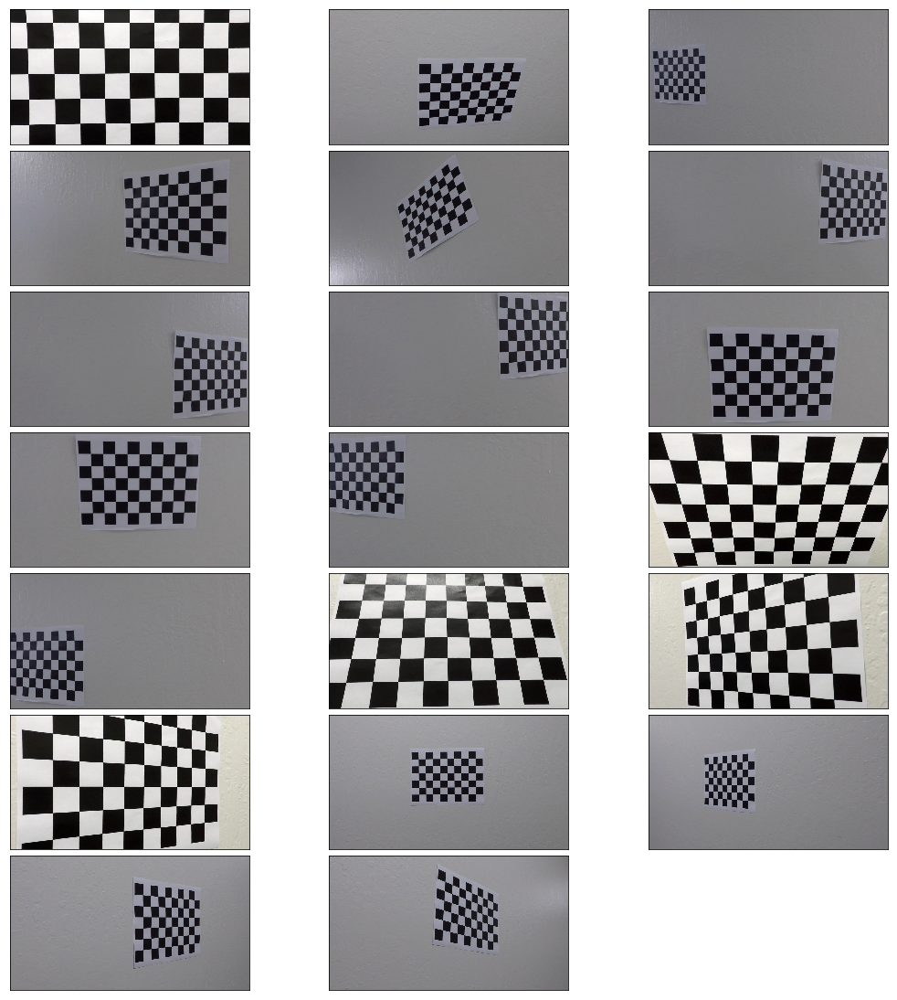

In [5]:
image_shape = calibration_images[0].shape[1::-1]
ret, mtx, dist = adv_laneline_detection.calibrate_camera(images_object_points, images_points, image_shape)
if ret:
    undistorted_images = [adv_laneline_detection.undistort_image(img, mtx, dist) for img in calibration_images]
# undistorted_images = adv_laneline_detection.undistort_images(object_points,
#                                                                        image_points,
#                                                                        calibration_images)
    utils.show_images(undistorted_images, image_name='all_undistorted_calibration_images', cols=3)

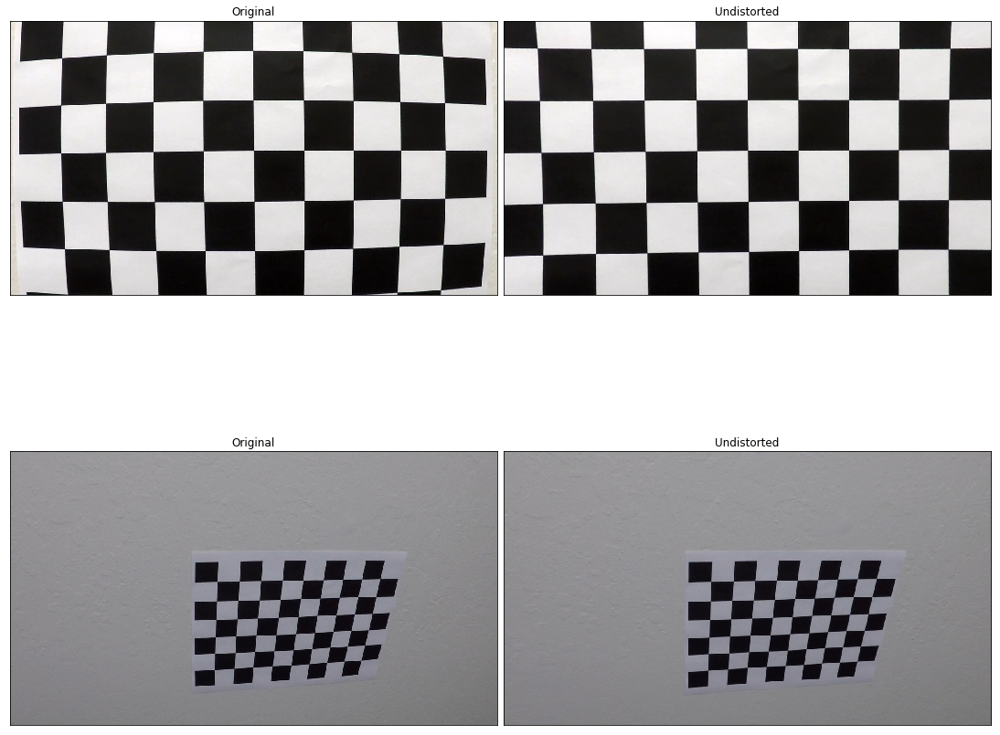

In [6]:
original_undistorted = [calibration_images[0], undistorted_images[0],
                        calibration_images[1], undistorted_images[1]]
utils.show_images(original_undistorted, ['Original', 'Undistorted', 'Original', 'Undistorted'], cols=2)

Here we see 2 images with there original distorted and undistorted variant, we can obviously identify the fisheye distortion that's in the first image and the straighter undistorted image, the second image is another story, the distortion is not as clear as in the the first image, but we can see the difference when we have it 

## Load Project Images 

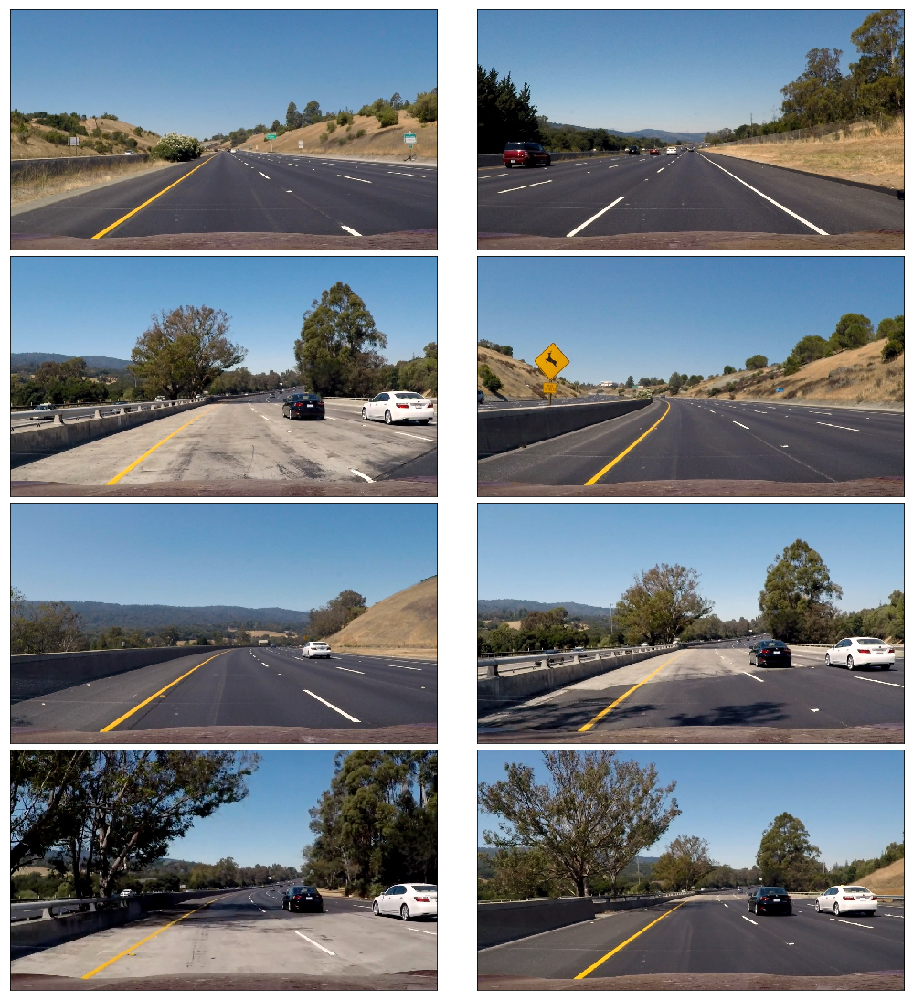

In [7]:
# Read in the test images
dir = "test_images/"
project_test_images = [mpimg.imread(dir + image_name) for image_name in os.listdir(dir)]
utils.show_images(project_test_images, image_name='all_project_test_images', cols=2)
project_test_images = [project_test_images[0],
                       project_test_images[2],
                       project_test_images[3],
                       project_test_images[6]]

## Calibrate Project Images

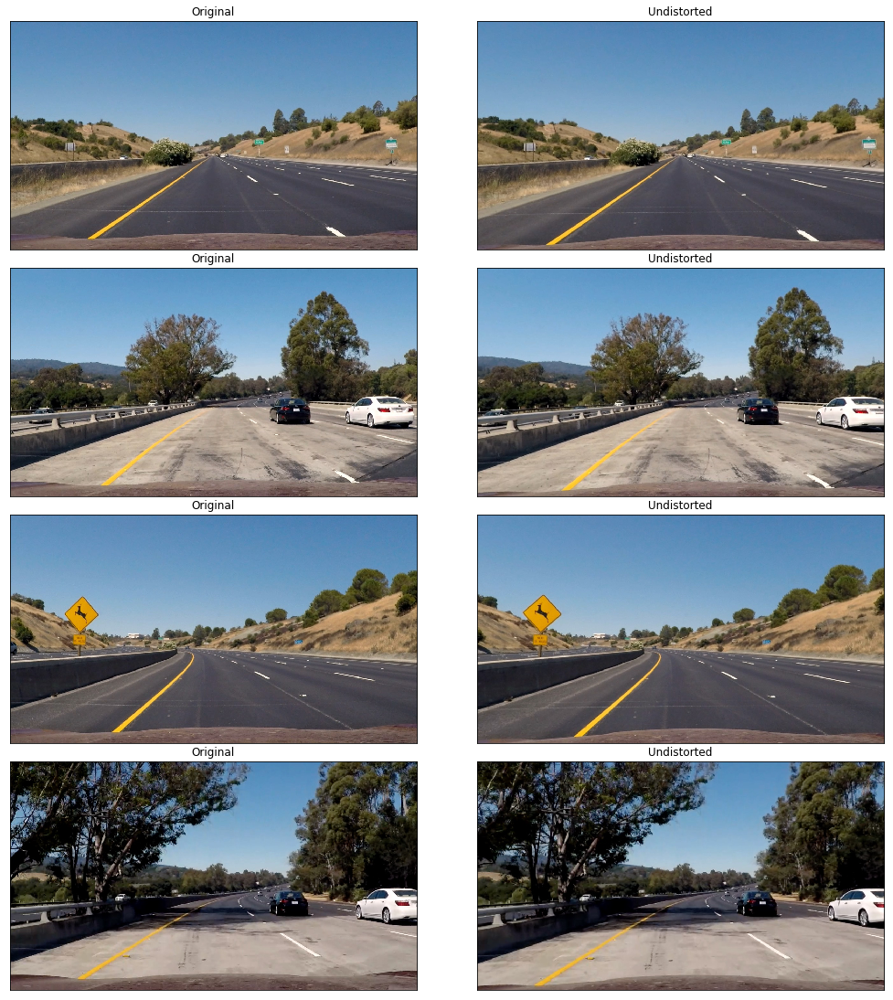

In [8]:
project_undistorted_images = [adv_laneline_detection.undistort_image(img, mtx, dist) for img in project_test_images] 
original_undistorted, titles = [], []
for original_img, undistorted_img in zip(project_test_images, project_undistorted_images):
    original_undistorted.append(original_img)
    titles.append('Original')
    original_undistorted.append(undistorted_img)
    titles.append('Undistorted')
utils.show_images(original_undistorted, 
                  titles,
                  image_name='project_original_undistorted_images', cols=2)

True

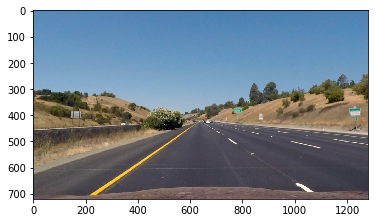

In [9]:
im = adv_laneline_detection.undistort_image(project_test_images[0], mtx, dist)
plt.imshow(im)
cv2.imwrite('messigray.png',im)

## Color Space Thresholding

Here we explore the benefits we can get from using a different color space 

### RGB Color space 

In [ ]:
R_channel = project_undistorted_images[-1][:, :, 0]
threshold = (200, 250)
binary_red = np.zeros_like(R_channel)
binary_red[(R_channel > threshold[0]) & (R_channel <= threshold[1])] = 1 

utils.show_images([project_undistorted_images[-1], R_channel, binary_red], 
                  ['Undistorted', 'Red channel', 'Binary red'],
                  image_name='undistorted_red_images', cols=2)

### HSL or HLS Color Space
Here I'll use the HLS color space as I already did in a prior project and it yielded the best results.

In [ ]:
hls_image = imageutils.convert_to_hsl(project_undistorted_images[-1])
S_channel = hls_image[:, :, 2]
threshold = (170, 255)
binary_S = np.zeros_like(S_channel)
binary_S[(S_channel > threshold[0]) & (S_channel <= threshold[1])] = 1
utils.show_images([project_undistorted_images[-1], hls_image, S_channel, binary_S], 
                  ['Undistorted', 'HSL', 'S channel', 'Binary S channel'],
                  image_name='undistorted_hsl_images', cols=2)

### Combined Approach 
As we saw the R channel correctly identifies the white line and the S channel correctly identifies lines under different lighting conditions, so lets combine both results to get a robust representation of our lanelines.

In [ ]:
combined_color_binary = np.zeros_like(binary_red)
combined_color_binary[(binary_red == 1) | (binary_S == 1) ] = 1

utils.show_images([project_undistorted_images[-1], binary_red, binary_S, combined_color_binary], 
                  ['Undistorted', 'Red binary', 'S binary', 'Combined binary'],
                  image_name='undistorted_combined_color_images', cols=2)

## Gradient Thresholding 
Lets take the third image as an example

### Sobel X & Y Thresholding

In [ ]:
abs_threshold = (20, 100)
gray_image = imageutils.convert_to_gray(project_undistorted_images[-1])
sobelx = adv_laneline_detection.abs_sobel_thresh(gray_image, 'x', 3, abs_threshold)
sobely = adv_laneline_detection.abs_sobel_thresh(gray_image, 'y', 3, abs_threshold)
utils.show_images([project_undistorted_images[-1], gray_image, sobelx, sobely], 
                  ['Undistorted', 'Gray', 'Sobel X', 'Sobel Y'],
                  image_name='undistorted_sobelxy_images', cols=2)

### Sobel Magnitude & Directional Thresholding

In [ ]:
mag_threshold = (40, 100)
dir_threshold = (1.0, 1.3)
sobel_mag = adv_laneline_detection.mag_sobel_thresh(gray_image, 17, mag_threshold)
sobel_dir = adv_laneline_detection.dir_sobel_thresh(gray_image, 17, dir_threshold)
utils.show_images([project_undistorted_images[-1], gray_image, sobel_mag, sobel_dir], 
                  ['Undistorted', 'Gray', 'Sobel Mag', 'Sobel Dir'],
                  image_name='undistorted_sobel_mag_dir_images', cols=2)

### Here are all the Sobel Images


In [ ]:
utils.show_images([project_undistorted_images[-1], gray_image, sobelx, sobely, sobel_mag, sobel_dir], 
                  ['Undistorted', 'Gray', 'Sobel X', 'Sobel Y','Sobel Mag', 'Sobel Dir'],
                  image_name='undistorted_all_sobel_images', cols=2)

## Combining Thresholds

In [ ]:
abs_threshold = (30, 100)
gray_image = imageutils.convert_to_gray(project_undistorted_images[-1])
combined_sobel_xy = adv_laneline_detection.combined_abs_sobelxy_thresh(gray_image, 3, abs_threshold)
utils.show_images([sobelx, sobely, combined_sobel_xy], 
                  ['Sobelx', 'Sobely', 'Combined Sobel'],
                  image_name='combined_sobelxy_images', cols=2)

### Combining Sobel Magnitude & Directional

In [ ]:
mag_threshold = (70, 100)
dir_threshold = (0.9, 1.3)
combined_sobel_mag_dir = adv_laneline_detection.combined_sobel_mag_dir_thresh(gray_image, 17, mag_threshold, dir_threshold)
utils.show_images([sobel_mag, sobel_dir, combined_sobel_mag_dir], 
                  ['Sobel Mag', 'Sobel Dir', 'Combined Sobel'],
                  image_name='combined_sobel_mag_dir_images', cols=2)

### Combining All Sobel Thresholds

In [ ]:
combined_sobel = np.zeros_like(gray_image)
combined_sobel[(combined_sobel_xy == 1) | (combined_sobel_mag_dir == 1) ] = 1
utils.show_images([combined_sobel_xy, combined_sobel_mag_dir, combined_sobel], 
                  ['Combined SobelXY', 'Combined SobelMagDir', 'Combined Sobel'],
                  image_name='combined_sobel_images', cols=2)

## Using Gradient and Color Thresholding 

Lets now get the best of both worlds and combine the result of the color thresholding and the one from the gradients to try and get a robust representation of our laneline under different conditions.

In [ ]:
combined_color_gradient = np.zeros_like(combined_sobel)
combined_color_gradient[(combined_color_binary == 1) | (combined_sobel == 1)] = 1 
stacked = np.dstack((np.zeros_like(combined_color_gradient), combined_color_binary, combined_sobel)) * 255
utils.show_images([combined_color_binary, combined_sobel, stacked, combined_color_gradient], 
                  ['Combined Color', 'Combined Sobel', 'Stacked Color & Sobel', 'Combined Color & Sobel'],
                  image_name='combined_color_sobel_images', cols=2)

Lets apply thresholding to all of our test images 

In [ ]:
# Color Thresholds 
red_thresh = (220, 250)
hls_thresh = (90, 255)
hls2_thresh = (170, 255)
# Gradient Thresholds 
xy_threshold = (20, 100)
mag_threshold = (70, 100)
dir_threshold = (1.1, 1.3)

thresholded_images = []

for img in project_test_images:
    # Undistort
    undistorted_image = adv_laneline_detection.undistort_image(img, mtx, dist)
    # Color Thresholding 
    color_binary_threshold = adv_laneline_detection.combined_color_threshold(undistorted_image, red_thresh, hls2_thresh)    
    # Gradient Thresholding (Sobel)
    sobel_binary_threshold = adv_laneline_detection.combined_sobel_thresh(undistorted_image,
                                                                          abs_kernel=3,
                                                                          mag_dir_kernel=17,
                                                                          abs_thresh=xy_threshold,
                                                                          mag_thresh=mag_threshold,
                                                                          dir_thresh=dir_threshold)
    # Staked result
    stacked = np.dstack((np.zeros_like(color_binary_threshold), color_binary_threshold, sobel_binary_threshold)) * 255
    
    combined_color_gradient = np.zeros_like(color_binary_threshold)
    combined_color_gradient[(color_binary_threshold == 1) | (sobel_binary_threshold == 1)] = 1 
                                                                          
    utils.show_images([color_binary_threshold, sobel_binary_threshold, stacked, combined_color_gradient], 
                  ['Combined Color', 'Combined Sobel', 'Stacked Color & Sobel', 'Combined Color & Sobel'],
                  cols=2)
    thresholded_images.append(combined_color_gradient)
# img = project_test_images[-1]
# undistorted_image = adv_laneline_detection.undistort_image(img, mtx, dist)
# binary_red = adv_laneline_detection.red_color_threshold(undistorted_image, red_thresh)
# binary_S = adv_laneline_detection.hls_color_threshold(undistorted_image, hls_thresh)
# b_s2 = adv_laneline_detection.hls_color_threshold(undistorted_image, hls2_thresh)
# combined_color_binary = np.zeros_like(binary_red)
# combined_color_binary[(binary_red == 1) | (binary_S == 1) ] = 1

# utils.show_images([project_undistorted_images[3], binary_red, binary_S, b_s2], 
#                   ['Undistorted', 'Red binary', 'S binary', 'Combined binary'],
#                   image_name='undistorted_combined_color_images', cols=2)

## Region of interest  (src)

Finally we'll be using a mask to only get an area of the image that has the lanelines and ignore other parts of the road like other cars, trees, mountains, etc.


In [ ]:
width, height = project_undistorted_images[0].shape[1], project_undistorted_images[0].shape[0]
# Top-Left, Top-right, Bottom-right, Bottom-left 
vertices = np.array([[(width * 0.10, height) # Bottom left
                 , (width * 0.40, height * 0.65)    # Top left vertix 60% if the image's hight
                 , (width * 0.60, height * 0.65)    # Top right vetrix 
                 , (width * 0.95, height)]]  # Bottom right
                 , dtype=np.int32)
vertices = np.array([[(width * 0.10, height * 0.95) # Bottom left
                 , (width * 0.45, height * 0.63)    # Top left vertix 60% if the image's hight
                 , (width * 0.56, height * 0.63)    # Top right vetrix 
                 , (width * 0.94, height * 0.95)]]  # Bottom right
                 , dtype=np.int32)



# vertices = np.array([[(237, 683) # Bottom left
#                  , (552, 471)    # Top left vertix 60% if the image's hight
#                  , (761, 471)    # Top right vetrix 
#                  , (1059, 683)]]  # Bottom right
#                  , dtype=np.int32)
masked_images = [adv_laneline_detection.region_of_interest(img, vertices) for img in project_undistorted_images]
undistorted_masked, titles = [], []
for undistorted_img, masked_image in zip(project_undistorted_images, masked_images):
    undistorted_masked.append(undistorted_img)
    titles.append('Undistorted')
    undistorted_masked.append(masked_image)
    titles.append('Masked')

utils.show_images(undistorted_masked, 
                  titles,
                  image_name='project_original_undistorted_images', cols=2)

## Transform Perspective (Warp)

Lets now first apply camera calibration for our real world images then perspective transform it.

In [ ]:
image_offset = 10
dest = np.float32([[image_offset, image_offset],
                   [width - image_offset, image_offset],
                   [image_offset, height - image_offset],
                   [width - image_offset, height - image_offset]])

dest = np.float32([[0, 0],# Top left
                   [0, height], # Bottom left
                   [width, height], # Bottom right
                   [width, 0]]) # Top right

dest = np.float32([[image_offset, 0],# Top left
                   [image_offset, height], # Bottom left
                   [width - image_offset, height], # Bottom right
                   [width - image_offset , 0]]) # Top right


src = np.float32([[width * 0.40, height * 0.68] # Top left vertix 60% if the image's hight
                , [width * 0.10, height * 0.95] # Bottom left
                , [width * 0.95, height * 0.95] # Bottom right 
                , [width * 0.64, height * 0.68]]) # Top right vetrix



src = np.float32([[width * 0.45, height * 0.63] # Top left vertix 60% if the image's hight
                , [width * 0.10, height * 0.95] # Bottom left
                , [width * 0.94, height * 0.95] # Bottom right 
                , [width * 0.56, height * 0.63]]) # Top right vetrix


# src = np.float32([[(width / 2) - 55,height / 2 + 100],#TL
#                         [((width / 6) - 10),height],#BL
#                          [(width * 5 / 6) + 60,height],#BR
#                          [(width / 2 + 55),height / 2 + 100]])#TR

undistorted_warped, titles = [], []
warped_images = []
M, Minv = None, None
for undistorted_image in thresholded_images:#project_undistorted_images:#
    titles.append('Undistorted')
    undistorted_warped.append(undistorted_image)
    warped_image, M, Minv = adv_laneline_detection.warp_and_transform_image(undistorted_image, src, dest)
    undistorted_warped.append(warped_image)
    titles.append('Warped')
    warped_images.append(warped_image)
warped_images.append(mpimg.imread('./warped_example.jpg'))

utils.show_images(undistorted_warped, 
                  titles,
                  image_name='project_undistorted_warped_images', cols=2)
# Smooth Threshold result
warped_images = [adv_laneline_detection.gaussian_blur(img, 11) for img in warped_images]

# print(len(warped_images))
# g = adv_laneline_detection.gaussian_blur(warped_images[1], 11)
# p = warped_images[1]
# utils.show_images([p, g], 
#                   titles,
#                   image_name='project_udfgndistorted_warped_images', cols=2)

## Sliding Window

In [ ]:
unwarped = cv2.warpPerspective(warped_images[0], Minv, (width, height))
utils.show_images([thresholded_images[0], unwarped])

### Histogram

In [ ]:
for img in warped_images:
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    img_copy = img.copy()
    img_copy[img.shape[0]//2:, :] += 1
    plt.imshow(img_copy, cmap='gray')
    plt.show()
    plt.plot(histogram)
    plt.show()

## Detect Lane Lines and Fit Polynomial

In [ ]:
# window settings
window_width = 50 
window_height = warped_images[0].shape[0] / 5 # Break image into 9 vertical layers since image height is 720
print(window_height)
margin = 100 # How much to slide left and right for searching



left_fits, right_fits = [], []

for warped, original_image in zip(warped_images, project_test_images):
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    
    # Get lanes centroids (Windows)
    window_centroids = adv_laneline_detection.find_window_centroids(warped,
                                                                    window_width,
                                                                    window_height,
                                                                    margin)
    
    # If we found any window centers
#     if len(window_centroids) > 0:
#         print('Yay')
    output, left_indices, right_indices = adv_laneline_detection.draw_lines_windows(warped,
                                                                                    window_width,
                                                                                    window_height,
                                                                                    nonzerox,
                                                                                    nonzeroy,
                                                                                    window_centroids)
    # Display the final results
    plt.imshow(output)
    plt.title('window fitting results')
    plt.show()
#     # If no window centers found, just display orginal road image
#     else:
#         output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_indices]
    lefty = nonzeroy[left_indices] 
    rightx = nonzerox[right_indices]
    righty = nonzeroy[right_indices] 


    
    # Get poly fits for the lane lines
    left_fit, right_fit = adv_laneline_detection.polyfit_lines(leftx, lefty, rightx, righty)
    
    # Color lane lines
    # making the original road pixels 3 color channels
    out_img = np.dstack((warped, warped, warped)) * 255
    out_img[nonzeroy[left_indices], nonzerox[left_indices]] = [255, 0, 0]
    out_img[nonzeroy[right_indices], nonzerox[right_indices]] = [0, 0, 255]
    # Draw polyfit and lane lines
    out_image, ploty, left_fitx, right_fitx = adv_laneline_detection.draw_polyfit(left_fit,
                                                                       right_fit,
                                                                       out_img)
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
    
    # Get curvature 
    lane_curvature = adv_laneline_detection.get_curvature(lefty, leftx, righty, rightx)
    print('Average curvature is {}'.format(lane_curvature))
    # Get car position
    car_position = adv_laneline_detection.get_vehicle_position()
    print('Car position of center is {}'.format(car_position))
    
    # Draw Drivable area 
    result = adv_laneline_detection.draw_drivable_area(warped,
                                                       original_image,
                                                       ploty,
                                                       left_fitx,
                                                       right_fitx,
                                                       Minv)
    plt.imshow(result)
    plt.show()


## LaneLineFinder object

In [ ]:
# Read in a thresholded image
warped = warped_images[1]
# window settings
window_width = 50 
window_height = warped_images[0].shape[0] / 5 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching
minipix = 50



left_fits, right_fits = [], []

for warped, undist_image in zip(warped_images, project_undistorted_images):
    left_indices, right_indices = [], []
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    
    # Get lanes centroids (Windows)
    window_centroids = adv_laneline_detection.find_window_centroids(warped, window_width, window_height, margin)

    
#     def draw_windows_and_polyfit():
    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows
        for level in range(0, len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask, l_inds = adv_laneline_detection.window_mask(window_width, 
                                 window_height, 
                                 warped, 
                                 window_centroids[level][0], 
                                 level, 
                                 nonzeroy,
                                 nonzerox)
            r_mask, r_inds = adv_laneline_detection.window_mask(window_width, 
                                 window_height, 
                                 warped, 
                                 window_centroids[level][1], 
                                 level,
                                 nonzeroy,
                                 nonzerox)
            
            
            left_indices.append(l_inds)
            right_indices.append(r_inds)
            
            
            

            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255
        
            
        
        # Draw the results
        template = np.array(r_points + l_points, np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel, template, zero_channel)), np.uint8) # make window pixels green
        warpage= np.dstack((warped, warped, warped)) * 255 # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.8, 0.0) # overlay the orignal road image with window results
        
    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    
    # Concatenate the arrays of indices
    left_indices = np.concatenate(left_indices)
    right_indices = np.concatenate(right_indices)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_indices]
    lefty = nonzeroy[left_indices] 
    rightx = nonzerox[right_indices]
    righty = nonzeroy[right_indices] 

    
    # Fit a second order polynomial to each
    # Quadratic cofficent A
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    left_fits.append(left_fit)
    right_fits.append(right_fit)
    
    
    # Color lane lines 
    warpage[nonzeroy[left_indices], nonzerox[left_indices]] = [255, 0, 0]
    warpage[nonzeroy[right_indices], nonzerox[right_indices]] = [0, 0, 255]
    # Draw polyfit
    _, ploty, left_fitx, right_fity = adv_laneline_detection.draw_polyfit(left_fit,
                                                                       right_fit,
                                                                       warpage)
    
    # Get curvature 
    print('Average curvature is {}'.format(adv_laneline_detection.get_curvature(lefty, leftx, righty, rightx)))
    # Get car position
    print('Car position of center is {}'.format(adv_laneline_detection.get_vehicle_position()))
    
    
    # Display the final results
    plt.imshow(output)
    plt.title('window fitting results')
    plt.show()
    
    # Draw Drivable area 
    adv_laneline_detection.draw_drivable_area(warped, undist_image, ploty, left_fitx, right_fitx, Minv)


In [ ]:
resized = cv2.resize(project_undistorted_images[0], (256, 256))
plt.imshow(project_undistorted_images[0])
plt.show()
plt.imshow(resized)
plt.show()
print(resized.shape)
resized_back = cv2.resize(resized, (1280, 720))
plt.imshow(resized_back)
plt.show()
print(resized_back.shape)

In [29]:
training_dir = 'bb/train/'
labels_dir = 'bb/lanelines_labels/'

training_images_paths = [(training_dir + image_name) for image_name in os.listdir(training_dir)]
label_images_paths = [(labels_dir + image_name) for image_name in os.listdir(labels_dir)]
dataset = datasetclasses.Dataset(training_images_paths, label_images_paths)
print('Training on {} images'.format(dataset.train.len))
print('Validating on {} images'.format(dataset.valid.len))
print(training_images_paths[0])
# utils.show_images(label_images)
BATCHSIZE = 8

print('Training generator')
train_generator, train_steps_per_epoch = kerasmodel.get_data_generator_and_steps_per_epoch(dataset.train,
                                                                                BATCHSIZE)

print('Validation generator')
validation_generator, validation_steps_per_epoch = kerasmodel.get_data_generator_and_steps_per_epoch(dataset.valid,
                                                                                          BATCHSIZE,
                                                                                          validation=True)

print('Training steps per epoch {}'.format(train_steps_per_epoch))
print('Validation steps per epoch {}'.format(validation_steps_per_epoch))


Training on 3768 images
Validating on 943 images
bb/train/0000f77c-6257be58.jpg
Training generator
7536
Validation generator
1886
Training steps per epoch 942
Validation steps per epoch 236


In [ ]:
training_dir = 'bb/train/'
labels_dir = 'bb/lanelines_labels/'

training_images_paths = [(training_dir + image_name) for image_name in os.listdir(training_dir)]
label_images_paths = [(labels_dir + image_name) for image_name in os.listdir(labels_dir)]
dataset = datasetclasses.Dataset(training_images_paths, label_images_paths)
print('Training on {} images'.format(dataset.train.len))
print('Validating on {} images'.format(dataset.valid.len))
print(training_images_paths[0])
# utils.show_images(label_images)
BATCHSIZE = 8

print('Training generator')
train_generator, train_steps_per_epoch = kerasmodel.get_data_generator_and_steps_per_epoch(dataset.train,
                                                                                BATCHSIZE)

print('Validation generator')
validation_generator, validation_steps_per_epoch = kerasmodel.get_data_generator_and_steps_per_epoch(dataset.valid,
                                                                                          BATCHSIZE,
                                                                                          validation=True)

print('Training steps per epoch {}'.format(train_steps_per_epoch))
print('Validation steps per epoch {}'.format(validation_steps_per_epoch))


##  Preprocess labels

##  Train Model

Started training on 
Data
Epoch 1/20
942/942 [==============================] - 271s 288ms/step - loss: 0.6491 - acc: 0.8893 - val_loss: 0.6067 - val_acc: 0.9670

Epoch 00001: val_loss improved from inf to 0.60673, saving model to tmp/best_model.h5
Epoch 2/20
942/942 [==============================] - 268s 284ms/step - loss: 0.5671 - acc: 0.9801 - val_loss: 0.5293 - val_acc: 0.9854

Epoch 00002: val_loss improved from 0.60673 to 0.52931, saving model to tmp/best_model.h5
Epoch 3/20
942/942 [==============================] - 269s 286ms/step - loss: 0.4961 - acc: 0.9873 - val_loss: 0.4631 - val_acc: 0.9888

Epoch 00003: val_loss improved from 0.52931 to 0.46314, saving model to tmp/best_model.h5
Epoch 4/20
942/942 [==============================] - 270s 286ms/step - loss: 0.4339 - acc: 0.9901 - val_loss: 0.4046 - val_acc: 0.9914

Epoch 00004: val_loss improved from 0.46314 to 0.40462, saving model to tmp/best_model.h5
Epoch 5/20
942/942 [==============================] - 270s 287ms/step 

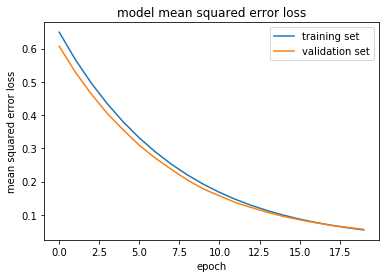

In [30]:
model_file = 'model_berkely.h5'
k_model = kerasmodel.KerasModel(model_file=model_file,
                             load=False)
EPOCHS = 20
# k_model.model.summary()
# Training the KerasModel model and getting the metrics
model_history = k_model.train_model_with_generator(train_generator,
                                                   train_steps_per_epoch,
                                                   EPOCHS,
                                                   validation_generator,
                                                   validation_steps_per_epoch,
                                                   save_model_filepath=model_file)
# Plotting the model Loss
utils.plot_loss(model_history=model_history)

##  Predict

In [ ]:
from PIL import Image
labels_dir = 'Seg_labels/'
label_images = [np.array(Image.open(labels_dir + image_name)) for image_name in os.listdir(labels_dir)]
p = preprocess_image_labels(label_images[0])
plt.imshow(p[:, :, 2])
# print()
# print(label_images[0][640,388, 1])
# print(label_images[0][470,1000, 1])
# print(label_images[0][440,810, 1])

In [ ]:
def true_values(softmax_image, original_image):
    image_new = np.zeros_like(original_image)
    road_pixels = (softmax_image[:, :, 0] > 0.75).nonzero()
    vehicle_pixels = (softmax_image[:, :, 1] > 0.75).nonzero()
    
    image_new[:, :, 0][road_pixels] = 1
    image_new[:, :, 1][vehicle_pixels] = 1

    return image_new

def process_prediction(softmax_image, original_image):
    image_new = np.zeros_like(original_image)
#     resized_softmax_image = cv2.resize(
#         softmax_image, (800, 600 - AMOUNT_TO_CROP), interpolation=cv2.INTER_CUBIC)

#     argmax = False
#     if argmax:
    reshaped_softmax = softmax_image.reshape(-1, softmax_image.shape[-1])
    max_channel = np.argmax(reshaped_softmax, -1).reshape((256, 256))
    road_pixels = (max_channel[:, :] == 0).nonzero()
    vehicle_pixels = (max_channel[:, :] == 1).nonzero()

#     else:
#         car_confidence = 0.10
#         road_confidence = 0.80
#         resized_softmax_image = cv2.resize(
#             softmax_image, (800, 600 - AMOUNT_TO_CROP), interpolation=cv2.INTER_CUBIC)
#         road_pixels = (resized_softmax_image[:, :, 0] > road_confidence).nonzero()
#         vehicle_pixels = (resized_softmax_image[:, :, 1] > car_confidence).nonzero()

#     from_y = AMOUNT_TO_CROP
#     road_binary_result = (road_pixels[0] + from_y, road_pixels[1])
#     car_binary_result = (vehicle_pixels[0] + from_y, vehicle_pixels[1])

#     car_binary_result = add_padding(car_binary_result)
#     print(car_binary_result)
#     exit()
    image_new[:, :, 0][road_pixels] = 1
    image_new[:, :, 1][vehicle_pixels] = 1
    return image_new

In [45]:
reload(utils)
reload(imageutils)
reload(adv_laneline_detection)
reload(kerasmodel)
image_to_predict = np.array(Image.open('test_images/straight_lines1.jpg'))

Succesfully loaded model.h5


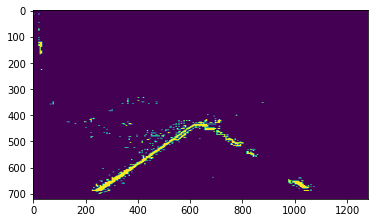

In [43]:
model_file = 'model.h5'
k_model = kerasmodel.KerasModel(model_file=model_file,
                             load=True)
lane_image = k_model.predict(image_to_predict)
plt.imshow(lane_image)

Succesfully loaded model_berkely.h5


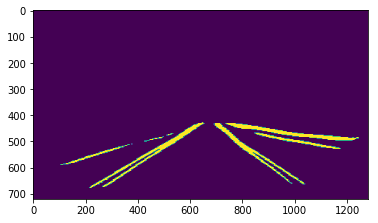

In [46]:

model_file = 'model_berkely.h5'
k_model = kerasmodel.KerasModel(model_file=model_file,
                             load=True)
lane_image = k_model.predict(image_to_predict)
plt.imshow(lane_image)

In [ ]:
plt.imshow(x)
plt.show()
lane_line_finder = adv_laneline_detection.LaneLineFinder(mtx, dist, k_model)
out = lane_line_finder.process_image(x)
plt.imshow(out)
plt.show()

In [ ]:
plt.imshow(x)
plt.show()
lane_line_finder = adv_laneline_detection.LaneLineFinder(mtx, dist)
out = lane_line_finder.process_image(x)
plt.imshow(out)
plt.show()

In [ ]:
x = project_undistorted_images[3]
plt.imshow(x)

plt.show()
preprocessed_image = kerasmodel.preprocess_image(x)
plt.imshow(preprocessed_image)
print(preprocessed_image.shape)
plt.show()
prediction = k_model.model.predict(preprocessed_image[None, :, :, :])
true_value = process_prediction(prediction[0], preprocessed_image)
plt.imshow(true_value[:, :, 0])
plt.show()
plt.imshow(cv2.resize(true_value, (1280, 720)))
plt.show()


## Video
 And now we come to the moment of truth which is the video, this will prove or disprove all of our work until now so what are we waiting for let's do this.

In [49]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

### Project Video

In [50]:
lane_line_finder  = adv_laneline_detection.LaneLineFinder(mtx, dist, k_model)
project_output = 'test_videos_output/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(lane_line_finder.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(project_output, audio=False)
#Close the reader properly 
clip1.reader.close()
clip1.audio.reader.close_proc()

[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4



  5%|████▎                                                                           | 67/1261 [00:09<02:44,  7.24it/s]


 11%|████████▍                                                                      | 135/1261 [00:18<02:37,  7.13it/s]


 16%|████████████▋                                                                  | 203/1261 [00:28<02:27,  7.16it/s]


 21%|████████████████▉                                                              | 271/1261 [00:37<02:18,  7.17it/s]


 27%|█████████████████████▏                                                         | 339/1261 [00:47<02:08,  7.17it/s]


 32%|█████████████████████████▍                                                     | 407/1261 [00:56<01:59,  7.16it/s]


 38%|█████████████████████████████▊                                                 | 475/1261 [01:06<01:50,  7.13it/s]


 43%|██████████████████████████████████                                             | 543/1261 [01:16<01:40,  7.13it/s]


 48%|██████████████████████████████████████▎                                        | 611/1261 [01:25<01:30,  7.17it/s]


 54%|██████████████████████████████████████████▌                                    | 679/1261 [01:34<01:20,  7.20it/s]


 59%|██████████████████████████████████████████████▊                                | 747/1261 [01:43<01:11,  7.21it/s]


 65%|███████████████████████████████████████████████████                            | 815/1261 [01:52<01:01,  7.22it/s]


 70%|███████████████████████████████████████████████████████▎                       | 883/1261 [02:02<00:52,  7.23it/s]


 75%|███████████████████████████████████████████████████████████▌                   | 951/1261 [02:11<00:42,  7.24it/s]


 81%|███████████████████████████████████████████████████████████████               | 1019/1261 [02:20<00:33,  7.27it/s]


 86%|███████████████████████████████████████████████████████████████████▏          | 1087/1261 [02:29<00:23,  7.28it/s]


 92%|███████████████████████████████████████████████████████████████████████▍      | 1155/1261 [02:38<00:14,  7.28it/s]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 1223/1261 [02:47<00:05,  7.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [02:53<00:00,  7.28it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

Wall time: 2min 53s


### Challenge Video

In [ ]:
lane_line_finder = adv_laneline_detection.LaneLineFinder(mtx, dist, k_model)
challenge_output = 'test_videos_output/challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(lane_line_finder.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(challenge_output, audio=False)
#Close the reader properly 
clip1.reader.close()
clip1.audio.reader.close_proc()

### Harder Challenge Video

In [51]:
lane_line_finderlane_lin  = adv_laneline_detection.LaneLineFinder(mtx, dist, k_model)
harder_challenge_output = 'test_videos_output/harder_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip1.fl_image(lane_line_finder.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(harder_challenge_output, audio=False)
#Close the reader properly 
clip1.reader.close()
clip1.audio.reader.close_proc()

[MoviePy] >>>> Building video test_videos_output/harder_challenge_video.mp4
[MoviePy] Writing video test_videos_output/harder_challenge_video.mp4



  6%|████▍                                                                           | 67/1200 [00:08<02:27,  7.70it/s]


 11%|████████▉                                                                      | 135/1200 [00:17<02:18,  7.69it/s]


 17%|█████████████▎                                                                 | 203/1200 [00:26<02:09,  7.69it/s]


 23%|█████████████████▊                                                             | 271/1200 [00:34<01:59,  7.78it/s]


 28%|██████████████████████▎                                                        | 339/1200 [00:43<01:49,  7.87it/s]


 34%|██████████████████████████▊                                                    | 407/1200 [00:51<01:39,  7.94it/s]


 40%|███████████████████████████████▎                                               | 475/1200 [01:00<01:31,  7.89it/s]


 45%|███████████████████████████████████▋                                           | 543/1200 [01:09<01:23,  7.86it/s]


 51%|████████████████████████████████████████▏                                      | 611/1200 [01:17<01:14,  7.91it/s]


 57%|████████████████████████████████████████████▋                                  | 679/1200 [01:25<01:05,  7.91it/s]


 62%|█████████████████████████████████████████████████▏                             | 747/1200 [01:34<00:57,  7.95it/s]


 68%|█████████████████████████████████████████████████████▋                         | 815/1200 [01:42<00:48,  7.95it/s]


 74%|██████████████████████████████████████████████████████████▏                    | 883/1200 [01:50<00:39,  8.00it/s]


 79%|██████████████████████████████████████████████████████████████▌                | 951/1200 [01:58<00:31,  8.01it/s]


 85%|██████████████████████████████████████████████████████████████████▏           | 1019/1200 [02:07<00:22,  8.01it/s]


 91%|██████████████████████████████████████████████████████████████████████▋       | 1087/1200 [02:15<00:14,  8.05it/s]


 96%|███████████████████████████████████████████████████████████████████████████   | 1155/1200 [02:23<00:05,  8.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [02:28<00:00,  8.05it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/harder_challenge_video.mp4 

Wall time: 2min 29s


### Challenge Test Images

In [ ]:
def get_curvature(warped_image, left_fit, right_fit):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = 360#np.max(warped_image.shape[0])
    print(y_eval)
    left_curverad = ((1 + (2 * left_fit[0] * y_eval + left_fit[1])**2)**1.5) / np.absolute(2 * left_fit[0])
    right_curverad = ((1 + (2 * right_fit[0] * y_eval + right_fit[1])**2)**1.5) / np.absolute(2 * right_fit[0])
    return left_curverad, right_curverad
for i in range(0, len(warped_images)):
    print(get_curvature(warped_images[i], left_fits[i], right_fits[i]))

In [ ]:
# Read in the test images
dir = "challenge_test_images/"
challenge_test_images = [mpimg.imread(dir + image_name) for image_name in os.listdir(dir)]

utils.show_images(challenge_test_images, image_name='all_challenge_project_test_images', cols=2)

In [ ]:
x = np.ones((8,8))
x[-1, 2] = 3
print(x)
window = np.ones((2))
l_sum = np.sum(x[int(3*x.shape[0]/4):,:int(x.shape[1]/2)], axis=0)
np.convolve(window, l_sum)
for i in range(1, 9):
    print(i)
t = np.array([(1,2), (3,4), (5,6)])
np.asarray(t)

In [ ]:
for img in warped_images:    
    adv_laneline_detection.histogram_sliding_window(img)

### Hard Challenge Test Images

In [ ]:
# Read in the test images
dir = "harder_challenge_test_images/"
harder_challenge_test_images = [mpimg.imread(dir + image_name) for image_name in os.listdir(dir)]

utils.show_images(harder_challenge_test_images, image_name='all_harder_challenge_project_test_images', cols=2)

In [ ]:
# Generate some fake data to represent lane-line pixels
ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
# For each y position generate random x position within +/-50 pix
# of the line base position in each case (x=200 for left, and x=900 for right)
leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                              for y in ploty])
rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                for y in ploty])

leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


# Fit a second order polynomial to pixel positions in each fake lane line
left_fit = np.polyfit(ploty, leftx, 2)
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fit = np.polyfit(ploty, rightx, 2)
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Plot up the fake data
mark_size = 3
plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images

(720, 1280, 4)
10056
229
229
(256, 256, 2)


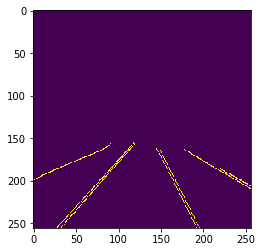

In [27]:

def preprocess_image_labels(label_image):
    LANE_LABEL = 229
    labels_new = np.zeros_like(label_image[:, :, :2])

    # Identify lane marking pixels (label is 6)
    lane_marking_pixels = (label_image[:, :, 0]).nonzero()
    labels_new[:, :, 0][lane_marking_pixels] = 1


    # Find all other labels
    other_pixels = ((label_image[:, :, 0] != LANE_LABEL))
    # Remove the labels by setting their pixels to 0 ~ None
    labels_new[:, :, 1][other_pixels] = 1
    return cv2.resize(labels_new, (256, 256))


image = np.array(Image.open('00ce95b0-84be34a3.png'))
print(image.shape)
print(len(image[:, :, 0].nonzero()[0]))
print(image[714, 170, 0])
print(image[443, 583, 0])
plt.imshow(image[:, :, 0])
zeros = np.zeros_like(image[:, :, :2])
preprocessed = preprocess_image_labels(image)
print(preprocessed.shape)
plt.imshow(preprocessed[:, :, 0])